### Check GPU availability

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `T4 GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Thu Apr  3 17:40:53 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   31C    P0             50W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
#@title Mount Google Drive
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Install dependencies

In [ ]:
!pip install -q rfdetr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.3/266.3 kB 21.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.6/131.6 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 115.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 88.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 60.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 37.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━

In [ ]:
#@title Import neccesary libraries
from rfdetr import RFDETRBase
from rfdetr.util.coco_classes import COCO_CLASSES
import supervision as sv
import numpy as np
from PIL import Image
import os
import random

## Inference with Pre-trained COCO Model

rf-detr-base.pth: 100%|██████████| 355M/355M [00:15<00:00, 23.5MiB/s]
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/88.2M [00:00<?, ?B/s]

Loading pretrain weights


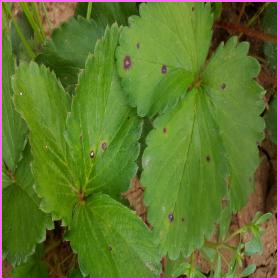

In [ ]:
# Open a random  image
train_path = "/content/drive/MyDrive/strawberrySAM2/dataset/train"
all_files = os.listdir(train_path)
image_list = [f for f in all_files if f.endswith(('.png',  '.jpg', 'jpeg'))]
random_idy = random.choice(image_list)
random_image_path = os.path.join(train_path, random_idy)
image = Image.open(random_image_path)

model = RFDETRBase()
detections = model.predict(image, threshold=0.2)

color = sv.ColorPalette.from_hex([
    "#ffff00", "#ff9b00", "#ff8080", "#ff66b2", "#ff66ff", "#b266ff",
    "#9999ff", "#3399ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
])
text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

bbox_annotator = sv.BoxAnnotator(color=color, thickness=thickness)
label_annotator = sv.LabelAnnotator(
    color=color,
    text_color=sv.Color.BLACK,
    text_scale=text_scale,
    smart_position=True
)

labels = [
    f"{COCO_CLASSES[class_id]} {confidence:.2f}"
    for class_id, confidence
    in zip(detections.class_id, detections.confidence)
]

annotated_image = image.copy()
annotated_image = bbox_annotator.annotate(annotated_image, detections)
annotated_image = label_annotator.annotate(annotated_image, detections, labels)
annotated_image

## Download dataset from Roboflow Universe

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
!pip install roboflow

#Download dataset
from roboflow import Roboflow
rf = Roboflow(api_key="Smzko2azI2R3w312n6nc")
project = rf.workspace("smartfarming-3adn8").project("strawberry-disease-detection-dataset-evgkx")
version = project.version(1)
dataset = version.download("coco")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Strawberry-Disease-Detection-Dataset-1 in coco:: 100%|██████████| 4926/4926 [00:00<00:00, 6483.75it/s]


## Train RF-DETR on custom dataset

In [ ]:
from rfdetr import RFDETRBase

model = RFDETRBase()
history = []

def callback2(data):
    history.append(data)

model.callbacks["on_fit_epoch_end"].append(callback2)

model.train(dataset_dir=dataset.location, epochs=25, batch_size=16, grad_accum_steps=1, lr=1e-4)
#model.train(dataset_dir=dataset.location, epochs=50, batch_size=4, grad_accum_steps=1, lr=1e-4)

Loading pretrain weights


reinitializing your detection head with 8 classes.


TensorBoard logging initialized. To monitor logs, use 'tensorboard --logdir output' and open http://localhost:6006/ in browser.
Not using distributed mode
git:
  sha: N/A, status: clean, branch: N/A

Namespace(num_classes=8, grad_accum_steps=1, amp=True, lr=0.0001, lr_encoder=0.00015, batch_size=16, weight_decay=0.0001, epochs=25, lr_drop=100, clip_max_norm=0.1, lr_vit_layer_decay=0.8, lr_component_decay=0.7, do_benchmark=False, dropout=0, drop_path=0.0, drop_mode='standard', drop_schedule='constant', cutoff_epoch=0, pretrained_encoder=None, pretrain_weights='rf-detr-base.pth', pretrain_exclude_keys=None, pretrain_keys_modify_to_load=None, pretrained_distiller=None, encoder='dinov2_windowed_small', vit_encoder_num_layers=12, window_block_indexes=None, position_embedding='sine', out_feature_indexes=[2, 5, 8, 11], freeze_encoder=False, layer_norm=True, rms_norm=False, backbone_lora=False, force_no_pretrain=False, dec_layers=3, dim_feedforward=2048, hidden_dim=256, sa_nheads=8, ca_nheads=

In [ ]:
#@title Tensorboard
%load_ext tensorboard
%tensorboard --logdir logs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#@title Imports
import matplotlib.pyplot as plt
import pandas as pd

#Convert history to DataFrame
df = pd.DataFrame(history)

In [ ]:
#@title Saving the Data

# Save metrics to CSV for later analysis
df.to_csv('training_metrics.csv', index=False)

# Save plot
plt.savefig('training_curves.png', dpi=300, bbox_inches='tight')
plt.close()

    epoch       mAP      AP50      AP75
0       0  0.617795  0.766693  0.663359
1       1  0.687379  0.848805  0.750216
2       2  0.729738  0.880340  0.795875
3       3  0.732104  0.894094  0.802895
4       4  0.749656  0.915492  0.819139
5       5  0.768909  0.926374  0.835767
6       6  0.779034  0.934877  0.853224
7       7  0.779748  0.938305  0.856670
8       8  0.782811  0.943921  0.853676
9       9  0.791702  0.950372  0.868461
10     10  0.784479  0.942316  0.871218
11     11  0.792765  0.937963  0.875476
12     12  0.800216  0.945298  0.881484
13     13  0.791740  0.938365  0.875229
14     14  0.802990  0.959116  0.880226
15     15  0.814444  0.952327  0.899161
16     16  0.806430  0.955955  0.888773
17     17  0.808485  0.948894  0.889320
18     18  0.815603  0.957640  0.886094
19     19  0.820313  0.960180  0.892722
20     20  0.819201  0.959734  0.907897
21     21  0.808456  0.956443  0.894523
22     22  0.822910  0.964474  0.902774
23     23  0.832901  0.963664  0.913250


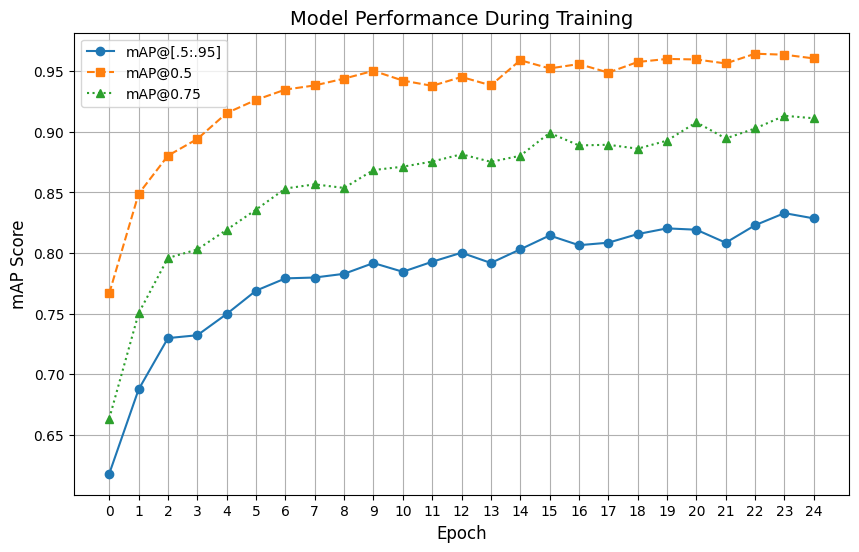

In [ ]:
#@title Mean Average Precision Metric
# Extract mAP metrics (COCO standard)
df['mAP'] = df['test_coco_eval_bbox'].apply(lambda x: x[0])  # mAP@[.5:.95]
df['AP50'] = df['test_coco_eval_bbox'].apply(lambda x: x[1])  # mAP@0.5
df['AP75'] = df['test_coco_eval_bbox'].apply(lambda x: x[2])  # mAP@0.75

# View the metrics
print(df[['epoch', 'mAP', 'AP50', 'AP75']])

# Plotting the mAP Curve
plt.figure(figsize=(10,6))

plt.plot(df['epoch'], df['mAP'], label='mAP@[.5:.95]', marker='o')
plt.plot(df['epoch'], df['AP50'], label='mAP@0.5', marker='s', linestyle='--')
plt.plot(df['epoch'], df['AP75'], label='mAP@0.75', marker='^', linestyle=':')

plt.xlabel('Epoch', fontsize=12)
plt.ylabel('mAP Score', fontsize=12)
plt.title('Model Performance During Training', fontsize=14)
plt.legend()
plt.grid(True)
plt.xticks(df['epoch'].unique())  # Show all epochs on x-axis
plt.show()

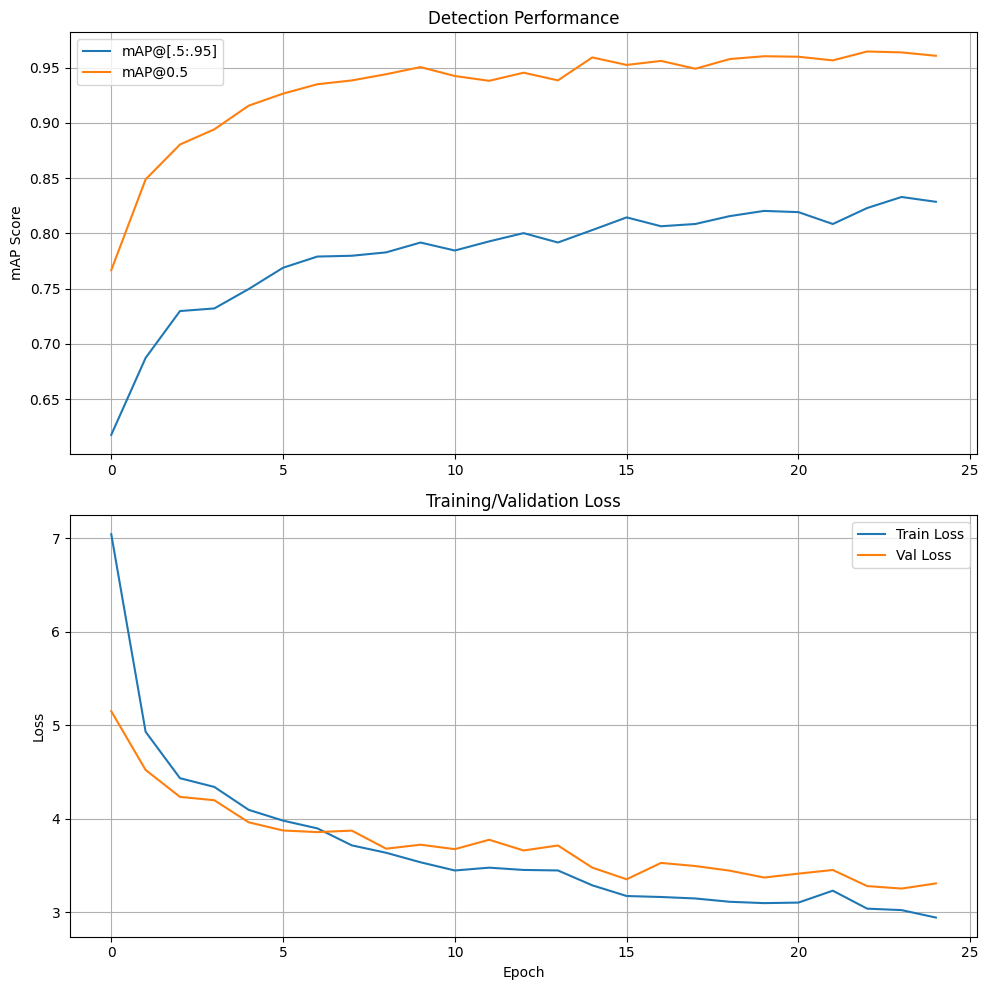

In [ ]:
#@title enhanced version with Loss Curves
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10,10))

# Plot mAP metrics
ax1.plot(df['epoch'], df['mAP'], label='mAP@[.5:.95]')
ax1.plot(df['epoch'], df['AP50'], label='mAP@0.5')
ax1.set_ylabel('mAP Score')
ax1.set_title('Detection Performance')
ax1.legend()
ax1.grid(True)

# Plot loss curves
ax2.plot(df['epoch'], df['train_loss'], label='Train Loss')
ax2.plot(df['epoch'], df['test_loss'], label='Val Loss')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.set_title('Training/Validation Loss')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

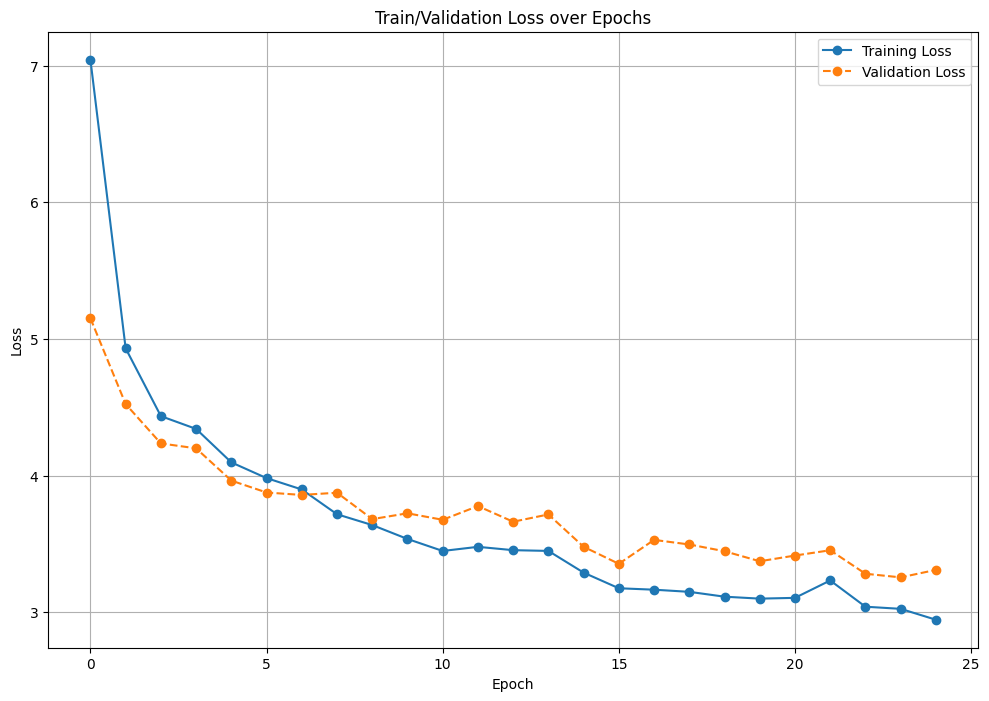

In [ ]:
#@title Train and Validation Loss Over Epochs
plt.figure(figsize=(12, 8))

plt.plot(
    df['epoch'],
    df['train_loss'],
    label='Training Loss',
    marker='o',
    linestyle='-'
)

plt.plot(
    df['epoch'],
    df['test_loss'],
    label='Validation Loss',
    marker='o',
    linestyle='--'
)

plt.title('Train/Validation Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.show()

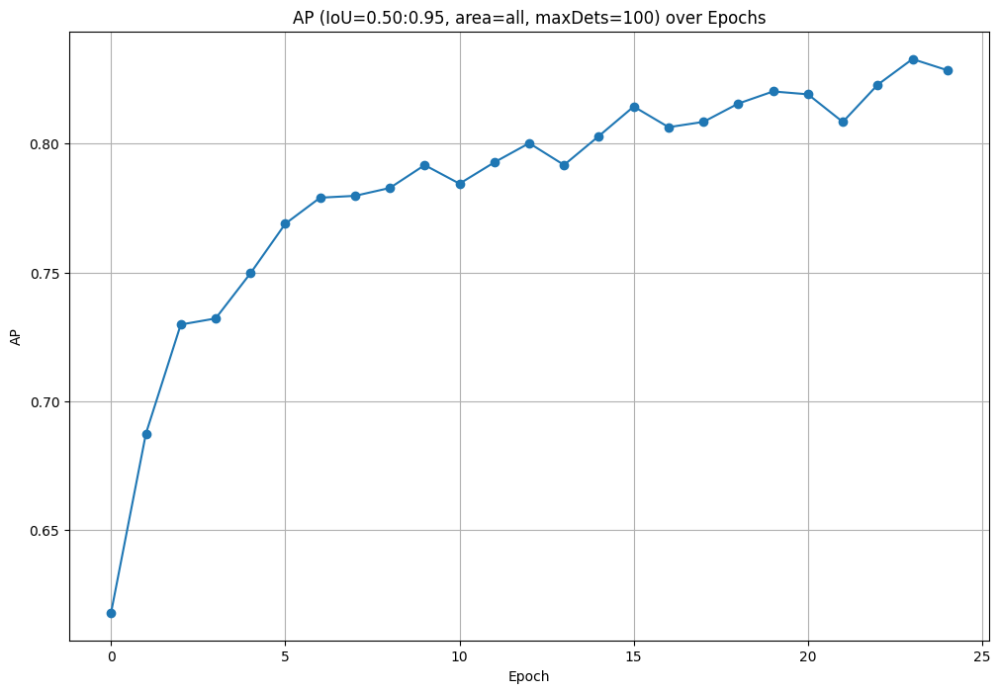

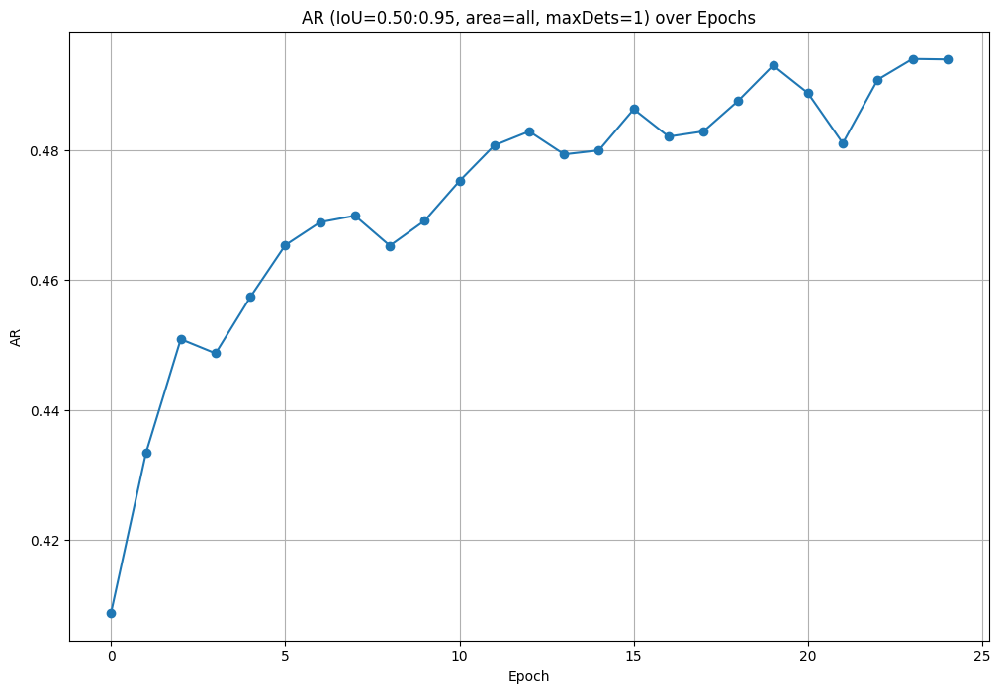

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

df = pd.DataFrame(history)

df['avg_precision'] = df['test_coco_eval_bbox'].apply(lambda arr: arr[0])
df['avg_recall'] = df['test_coco_eval_bbox'].apply(lambda arr: arr[6])

plt.figure(figsize=(12, 8))
plt.plot(
    df['epoch'],
    df['avg_precision'],
    marker='o',
    linestyle='-'
)
plt.title('AP (IoU=0.50:0.95, area=all, maxDets=100) over Epochs')
plt.xlabel('Epoch')
plt.ylabel('AP')
plt.grid(True)
plt.show()


plt.figure(figsize=(12, 8))
plt.plot(
    df['epoch'],
    df['avg_recall'],
    marker='o',
    linestyle='-'
)
plt.title('AR (IoU=0.50:0.95, area=all, maxDets=1) over Epochs')
plt.xlabel('Epoch')
plt.ylabel('AR')
plt.grid(True)
plt.show()

## Run inference with fine-tuned model

In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/test",
    annotations_path=f"{dataset.location}/test/_annotations.coco.json",
)

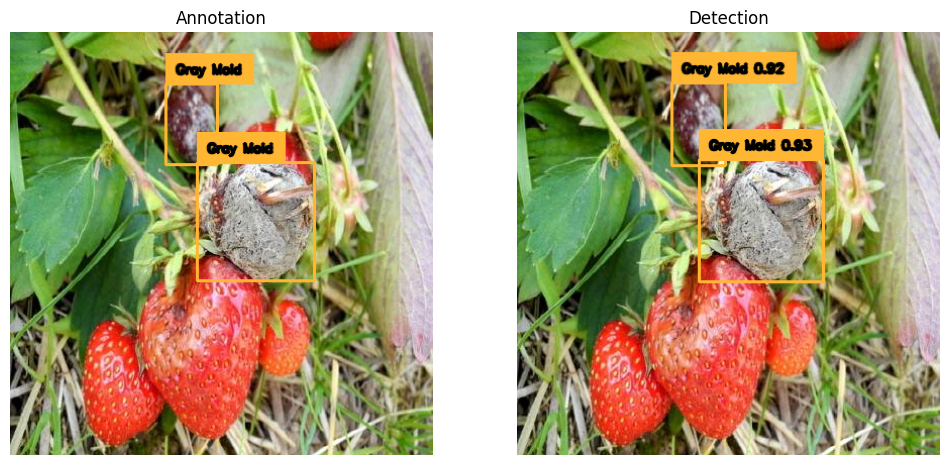

In [ ]:
from rfdetr import RFDETRBase
import supervision as sv
from PIL import Image

#####
import random
from PIL import Image

# Select a random index
random_idx = random.randint(0, len(ds) - 1)
# Retrieve the image and annotations
path, image, annotations = ds[random_idx]
# Open the image
image = Image.open(path)

detections = model.predict(image, threshold=0.5)

text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

bbox_annotator = sv.BoxAnnotator(thickness=thickness)
label_annotator = sv.LabelAnnotator(
    text_color=sv.Color.BLACK,
    text_scale=text_scale,
    text_thickness=thickness,
    smart_position=True)

annotations_labels = [
    f"{ds.classes[class_id]}"
    for class_id
    in annotations.class_id
]

detections_labels = [
    f"{ds.classes[class_id]} {confidence:.2f}"
    for class_id, confidence
    in zip(detections.class_id, detections.confidence)
]

annotation_image = image.copy()
annotation_image = bbox_annotator.annotate(annotation_image, annotations)
annotation_image = label_annotator.annotate(annotation_image, annotations, annotations_labels)

detections_image = image.copy()
detections_image = bbox_annotator.annotate(detections_image, detections)
detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

sv.plot_images_grid(images=[annotation_image, detections_image], grid_size=(1, 2), titles=["Annotation", "Detection"])

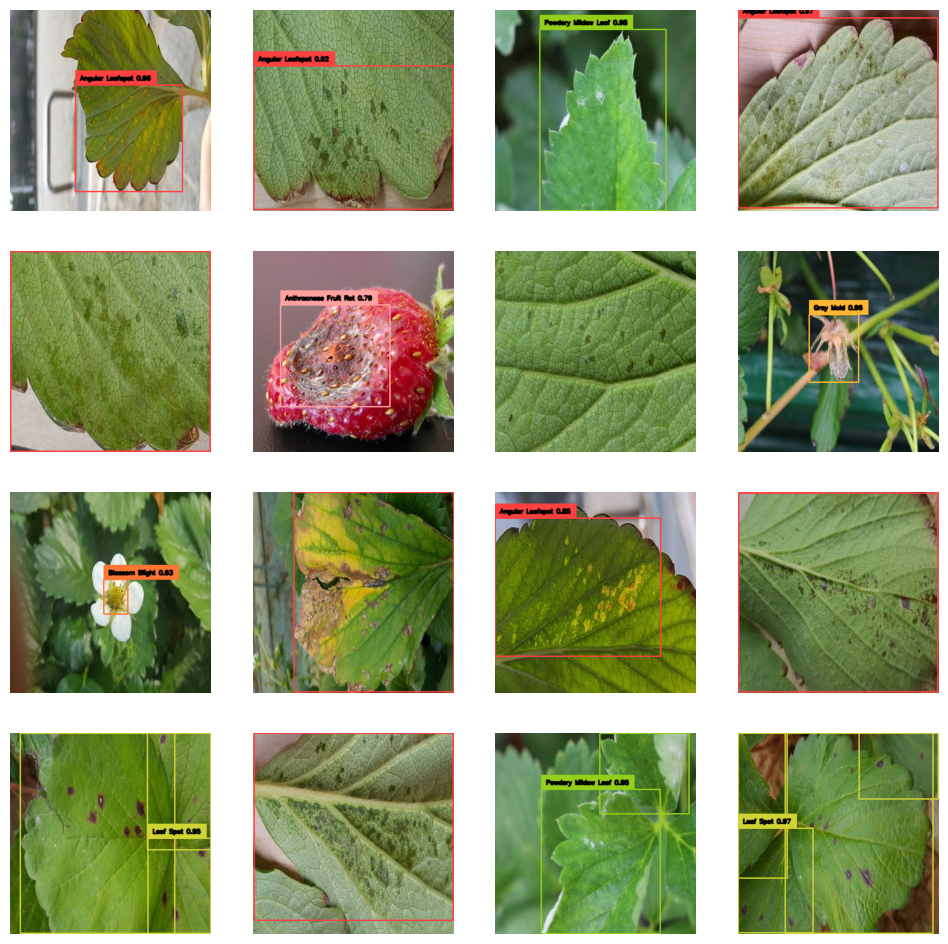

In [ ]:
import supervision as sv
from rfdetr import RFDETRBase
from PIL import Image

detections_images = []

for i in range(16):
    path, image, annotations = ds[i]
    image = Image.open(path)

    detections = model.predict(image, threshold=0.5)

    text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
    thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

    bbox_annotator = sv.BoxAnnotator(thickness=thickness)
    label_annotator = sv.LabelAnnotator(
        text_color=sv.Color.BLACK,
        text_scale=text_scale,
        text_thickness=thickness,
        smart_position=True)

    detections_labels = [
        f"{ds.classes[class_id]} {confidence:.2f}"
        for class_id, confidence
        in zip(detections.class_id, detections.confidence)
    ]

    detections_image = image.copy()
    detections_image = bbox_annotator.annotate(detections_image, detections)
    detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

    detections_images.append(detections_image)

sv.plot_images_grid(images=detections_images, grid_size=(4, 4))

## Evaluate fine-tuned model

In [ ]:
import supervision as sv
from tqdm import tqdm
from supervision.metrics import MeanAveragePrecision

targets = []
predictions = []

for path, image, annotations in tqdm(ds):
    image = Image.open(path)
    detections = model.predict(image, threshold=0.5)

    targets.append(annotations)
    predictions.append(detections)

100%|██████████| 486/486 [00:13<00:00, 35.10it/s]


In [ ]:
print(ds.classes)

['Strawberry-Disease', 'Angular Leafspot', 'Anthracnose Fruit Rot', 'Blossom Blight', 'Gray Mold', 'Leaf Spot', 'Powdery Mildew Fruit', 'Powdery Mildew Leaf']


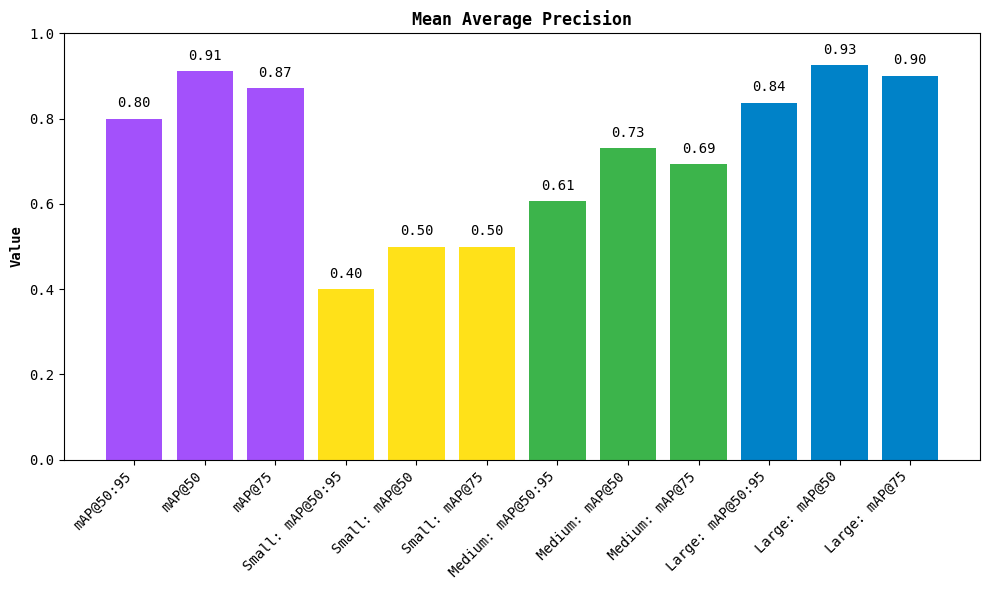

In [ ]:
map_metric = MeanAveragePrecision()
map_result = map_metric.update(predictions, targets).compute()

map_result.plot()

In [1]:
confusion_matrix = sv.ConfusionMatrix.from_detections(
    predictions=predictions,
    targets=targets,
    classes=ds.classes
)

_ = confusion_matrix.plot()

plt.show()


NameError: name 'sv' is not defined

In [ ]:
!cp -r /content/output /content/drive/MyDrive/

In [ ]:
!cp -r /content/rf-detr-base.pth /content/drive/MyDrive/sample_data